# DATASET NOTEBOOK

Here, we load our dataset (DFC-2023 track 2)
We explain the data used along with some observations and analysis for why we used the data in the way that we did.

The data is loaded from Data Fusion Contest 2023.

Acknowledgement: 

2023 IEEE GRSS Data Fusion Contest.
Online: [www.grss-ieee.org/technical-committees/image-analysis-and-data-fusion/](www.grss-ieee.org/technical-committees/image-analysis-and-data-fusion/) 


In [39]:
!pip install rasterio

import os
import shutil
import random
import copy
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os.path as osp

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils import data
from torch.utils.data import DataLoader

import torchvision
from tqdm import tqdm, notebook as tqdm_notebook
import rasterio
from osgeo import gdal

data_root = '/kaggle/input/track2'

## Data root directory where we store the rgb, sar, dsm data

## Here, we merge the rgb and sar data together and store it in '/kaggle/working/track2/train/merge'

In [40]:
def read_img(filename):
    dataset = gdal.Open(filename)
    im_data = dataset.ReadAsArray()
    im_proj = dataset.GetProjection()
    im_geotrans = dataset.GetGeoTransform()
    return im_data, im_proj, im_geotrans

def write_img(filename, im_proj, im_geotrans, im_data):
    if len(im_data.shape) == 3:
        bands, height, width = im_data.shape
    else:
        bands, (height, width) = 1, im_data.shape

    driver = gdal.GetDriverByName("GTiff")
    datatype = gdal.GDT_Float32
    dataset = driver.Create(filename, width, height, bands, datatype)
    dataset.SetGeoTransform(im_geotrans)
    dataset.SetProjection(im_proj)

    if bands == 1:
        dataset.GetRasterBand(1).WriteArray(im_data)
    else:
        for i in range(bands):
            dataset.GetRasterBand(i + 1).WriteArray(im_data[i])
    del dataset

def make_merge(rgb_path, sar_path, merge_path):
    data_rgb, proj, geotrans = read_img(rgb_path)
    data_sar, _, _ = read_img(sar_path)
    if data_sar.ndim == 2:
        data_sar = data_sar[np.newaxis, :, :]
    data_sar = np.log1p(data_sar)
    data_merge = np.concatenate([data_rgb, data_sar], axis=0)
    write_img(merge_path, proj, geotrans, data_merge)

root = os.path.join(data_root, 'train')
merged_dir = os.path.join('/kaggle/working/track2/train/merge')
os.makedirs(merged_dir, exist_ok=True)

rgb_dir = os.path.join(root, 'rgb')
sar_dir = os.path.join(root, 'sar')

for f in tqdm(os.listdir(rgb_dir)):
    if f.endswith('.tif') and os.path.exists(os.path.join(sar_dir, f)):
        rgb_path = os.path.join(rgb_dir, f)
        sar_path = os.path.join(sar_dir, f)
        merge_path = os.path.join(merged_dir, f)
        make_merge(rgb_path, sar_path, merge_path)

print("Merged RGB + SAR saved to:", merged_dir)

100%|██████████| 1773/1773 [01:34<00:00, 18.82it/s]

Merged RGB + SAR saved to: /kaggle/working/track2/train/merge


## Here we copy the dsm files to the kaggle working directory and convert them to numpy arrays

In [41]:
src_folder = os.path.join(data_root, "train", "dsm")
dst_folder = "/kaggle/working/track2/train/dsm"

os.makedirs(dst_folder, exist_ok=True)

for f in os.listdir(src_folder):
    if f.endswith(".tif"):
        shutil.copy(os.path.join(src_folder, f), os.path.join(dst_folder, f))

print("DSM .tif files copied to writable folder.")

tif_folder = "/kaggle/working/track2/train/dsm"
npy_folder = "/kaggle/working/track2/train/dsmnpy"
os.makedirs(npy_folder, exist_ok=True)

for fname in os.listdir(tif_folder):
    if fname.endswith(".tif"):
        tif_path = os.path.join(tif_folder, fname)
        npy_path = os.path.join(npy_folder, fname.replace(".tif", ".npy"))

        with rasterio.open(tif_path) as src:
            arr = src.read(1)
            np.save(npy_path, arr)

print("DSM conversion to .npy complete.")

DSM .tif files copied to writable folder.
DSM conversion to .npy complete.


## Here, we create divide the training folder into train (70%), validation (20%), and test (10%), put the image ids into seperate files and store them

In [42]:
rgb_dir = os.path.join(data_root, "train", "rgb")
dsm_dir = "/kaggle/working/track2/train/dsmnpy"

all_merge = [f for f in os.listdir(rgb_dir) if f.endswith(".tif")]
valid_samples = []

for f in all_merge:
    name = os.path.splitext(f)[0]
    if os.path.exists(os.path.join(dsm_dir, f"{name}.npy")):
        valid_samples.append(name)

random.shuffle(valid_samples)
train_split = int(0.7 * len(valid_samples))
val_split = int(0.9 * len(valid_samples))

train_ids = valid_samples[:train_split]
val_ids = valid_samples[train_split:val_split]
test_ids = valid_samples[val_split:]

with open("/kaggle/working/train_list.txt", 'w') as f:
    f.write("\n".join(train_ids))
with open("/kaggle/working/val_list.txt", 'w') as f:
    f.write("\n".join(val_ids))
with open("/kaggle/working/test_list.txt", 'w') as f:
    f.write("\n".join(test_ids))

print("Split lists saved (train/val/test)")

Split lists saved (train/val/test)


## The next two cells are for data loading, now we create the dataset class, and then load the images

In [43]:
class ISPRSDataSet(data.Dataset):
    def __init__(self, root, list_path, crop_size=(512, 512), mean=(128, 128, 128, 0.2037), scale=False, mirror=True):
        self.root = root
        self.list_path = list_path
        self.crop_h, self.crop_w = crop_size
        self.mean = mean # using 0.2037 for the SAR data, using a code snippet to go through all SAR images and calculate mean
        self.scale = scale
        self.is_mirror = mirror
        self.img_ids = [i_id.strip() for i_id in open(list_path)]
        self.files = []

        for name in self.img_ids:
            img_file = osp.join(self.root, "merge/%s.tif" % name)
            dsm_file = osp.join(self.root, "dsmnpy/%s.npy" % name)
            self.files.append({
                "img": img_file,
                "dsm": dsm_file,
                "name": name
            })

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        datafiles = self.files[index]
        with rasterio.open(datafiles["img"]) as src:
            image = src.read().astype(np.float32)
        dsm = np.load(datafiles["dsm"]).astype(np.float32)
        dsm = np.reshape(dsm, (dsm.shape[0], dsm.shape[1], 1))
        image = image - np.array(self.mean)[:, None, None]
        _, h, w = image.shape
        if h < self.crop_h or w < self.crop_w:
            raise ValueError(f"Cannot crop to {self.crop_h}×{self.crop_w} from image size {h}×{w}")
        h_off = (h - self.crop_h) // 2
        w_off = (w - self.crop_w) // 2
        image = image[:, h_off:h_off + self.crop_h, w_off:w_off + self.crop_w]
        dsm = dsm[h_off:h_off + self.crop_h, w_off:w_off + self.crop_w, :]
        dsm = dsm.transpose((2, 0, 1))
        return image.copy(), dsm.copy(), (h, w), datafiles["name"]

In [44]:
final_data_root = "/kaggle/working/track2/train"

train_dataset = ISPRSDataSet(
    root=final_data_root,
    list_path="/kaggle/working/train_list.txt",
    crop_size=(512, 512)
)

val_dataset = ISPRSDataSet(
    root=final_data_root,
    list_path="/kaggle/working/val_list.txt",
    crop_size=(512, 512)
)

test_dataset = ISPRSDataSet(
    root=final_data_root,
    list_path="/kaggle/working/test_list.txt",
    crop_size=(512, 512)
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=2)

## This is the data used for training, validation, and testing.
## Below, we'll plot the data in multiple ways to infer patterns, and justify the choices we made while training our model

### Here, we plot RGB images, SAR images, DSM images, then RGB overlapped with DSM

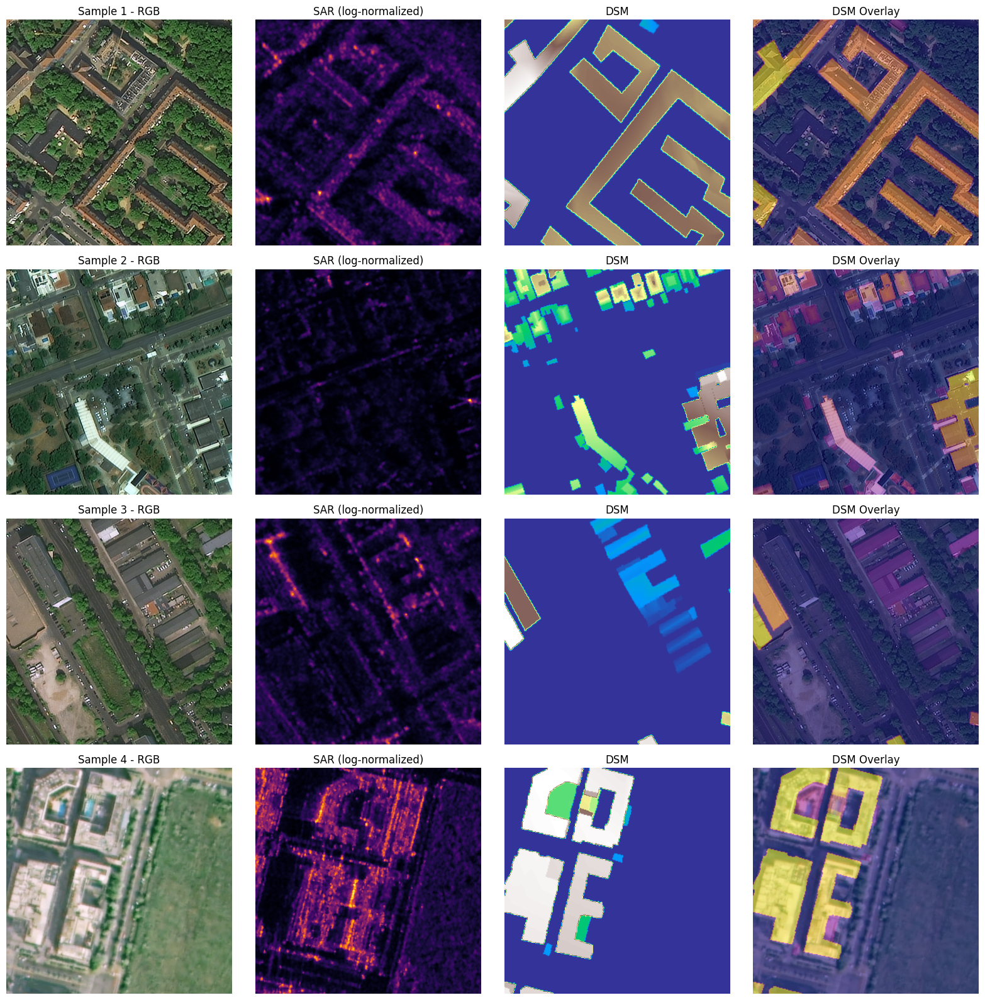

In [45]:
images, dsms, _, _ = next(iter(train_loader))
images = images.numpy()
dsms = dsms.numpy()
batch_size = images.shape[0]

fig, axs = plt.subplots(batch_size, 4, figsize=(16, 4 * batch_size))

for i in range(batch_size):
    rgb = images[i][:3] + np.array(train_dataset.mean[:3])[:, None, None]
    rgb = np.clip(rgb.transpose(1, 2, 0) / 255.0, 0, 1)

    sar = images[i][3] + train_dataset.mean[3]
    sar = np.log1p(sar)
    sar = (sar - sar.min()) / (sar.max() - sar.min())

    dsm = dsms[i][0]
    dsm_norm = dsm / np.max(dsm + 1e-5)

    axs[i, 0].imshow(rgb)
    axs[i, 0].set_title(f"Sample {i + 1} - RGB")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(sar, cmap='inferno')
    axs[i, 1].set_title("SAR (log-normalized)")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(dsm_norm, cmap='terrain')
    axs[i, 2].set_title("DSM")
    axs[i, 2].axis('off')

    axs[i, 3].imshow(rgb)
    axs[i, 3].imshow(dsm_norm, cmap='plasma', alpha=0.5)
    axs[i, 3].set_title("DSM Overlay")
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()


### Analysis:

A couple of things to note here: 
First, SAR data can be very noisy, so we must use it cautiously.
Second, the DSM data overlaps with buildings only (obviously, we're doing building height estimation), but this means things like trees etc. do not get counted. As you can see though, they still contribute to the changes in SAR data, potentially contributing to its noisiness.
In the original HGD implementation, SAR data was not used as they found it not to be aligning properly wih the building heights, which is to be expected. Following this, in our initial baseline model, we didn't use SAR data either. However, as you'll see below, we found SAR data could be a good guide, even if it wasn't perfect or noisy. This was reinforced in our later models, leading to an increased accuracy in both improvement 1 and improvement 2.


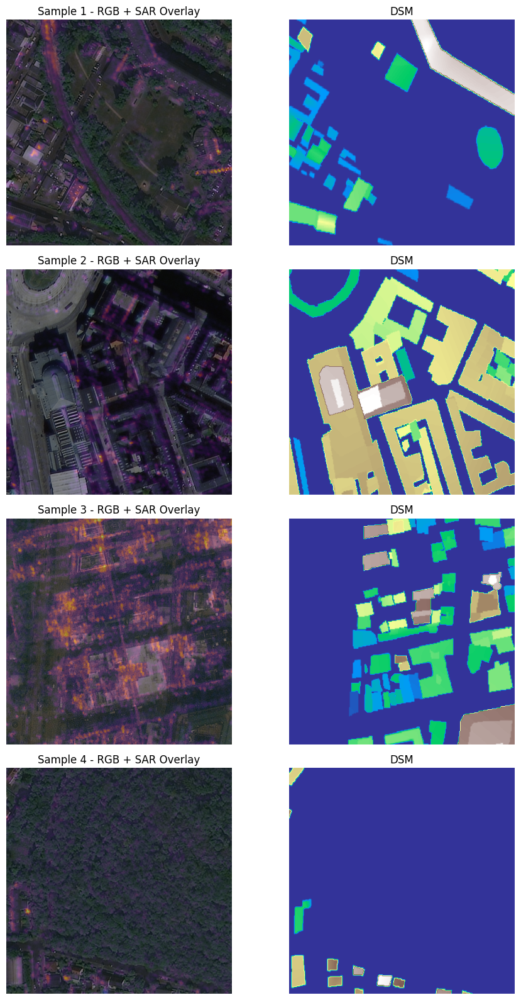

In [46]:
images, dsms, _, _ = next(iter(train_loader))
images = images.numpy()
dsms = dsms.numpy()
batch_size = images.shape[0]

fig, axs = plt.subplots(batch_size, 2, figsize=(10, 4 * batch_size))

for i in range(batch_size):
    rgb = images[i][:3] + np.array(train_dataset.mean[:3])[:, None, None]
    rgb = np.clip(rgb.transpose(1, 2, 0) / 255.0, 0, 1)

    sar = images[i][3] + train_dataset.mean[3]
    sar = np.log1p(sar)
    sar = (sar - sar.min()) / (sar.max() - sar.min())

    dsm = dsms[i][0]
    dsm_norm = dsm / (np.max(dsm) + 1e-5)

    axs[i, 0].imshow(rgb)
    axs[i, 0].imshow(sar, cmap='inferno', alpha=0.5)
    axs[i, 0].set_title(f"Sample {i+1} - RGB + SAR Overlay")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(dsm_norm, cmap='terrain')
    axs[i, 1].set_title("DSM")
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


### Analysis

There are definitely cases where the SAR data does not fit the DSM values properly, but there are also multiple ones where has a direct overlap. The main issue with SAR again is greenery - trees etc that particularly impact when there are no other buildings in the area. We trust the model to filter out the areas with greenery leading to incorrect inference from SAR data, and relying on SAR data to help with predictions where the model detects buildings.

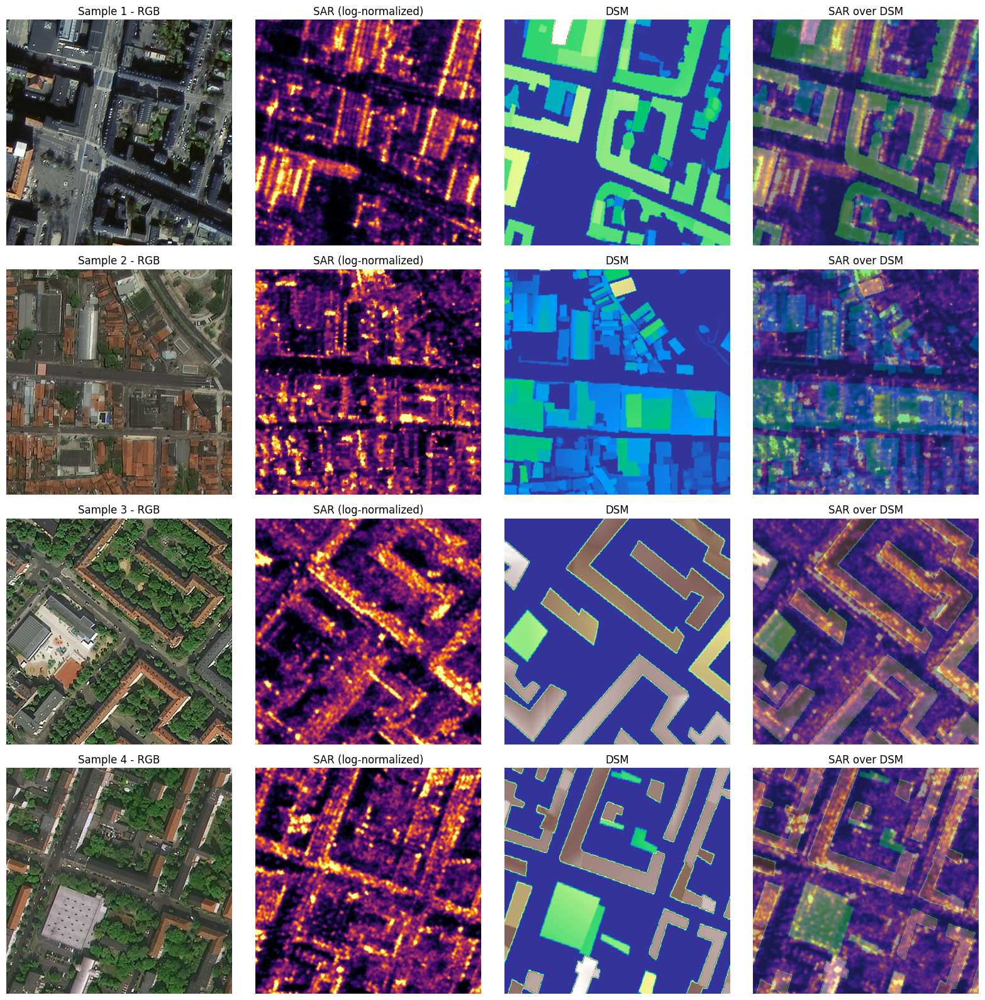

In [47]:
images, dsms, _, _ = next(iter(train_loader))
images = images.numpy()
dsms = dsms.numpy()
batch_size = images.shape[0]

fig, axs = plt.subplots(batch_size, 4, figsize=(16, 4 * batch_size))

for i in range(batch_size):
    rgb = images[i][:3] + np.array(train_dataset.mean[:3])[:, None, None]
    rgb = np.clip(rgb.transpose(1, 2, 0) / 255.0, 0, 1)

    sar = images[i][3] + train_dataset.mean[3]
    sar = np.log1p(sar)
    sar = (sar - np.percentile(sar, 2)) / (np.percentile(sar, 98) - np.percentile(sar, 2))
    sar = np.clip(sar, 0, 1)

    dsm = dsms[i][0]
    dsm_norm = dsm / (np.max(dsm) + 1e-5)

    axs[i, 0].imshow(rgb)
    axs[i, 0].set_title(f"Sample {i + 1} - RGB")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(sar, cmap='inferno')
    axs[i, 1].set_title("SAR (log-normalized)")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(dsm_norm, cmap='terrain')
    axs[i, 2].set_title("DSM")
    axs[i, 2].axis('off')

    axs[i, 3].imshow(dsm_norm, cmap='terrain')
    axs[i, 3].imshow(sar, cmap='inferno', alpha=0.5)
    axs[i, 3].set_title("SAR over DSM")
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()

### Analysis

To further our point: The SAR data does not work well in areas with lots of greenery, however it is still helpful as it shows a clear spike in areas with tall buildings. We noticed our model particularly struggled with estimating heights of tall buildings. To this end, SAR data would help in improving accuracy in cases with tall buildings (particularly those not at tree height)

Why not apply a filter that masks out SAR data values where RGB values show greenery using some predetermined threshold?

Two reasons.
- The main reason is the clear shift in values. As we can see above, higher SAR data values do correspond to taller buildings, however there is not an exact overlap. We hope it has an effect somewhere along the lines of telling the model - Hey, there is a tall building here somewhere - leaving it up to the model's segmentation capability to actually figure out the nearby building. Now assume this mismatch leads the SAR data to be on top of some greenery and we mask it out, the data now is lost. It becomes more difficult for the model to infer the height of the taller buildings.
- Dealing with rooftops with greenery on top of them would become difficult. Our filter would remove that SAR data completely, leading to loss of data for inference when estimating that building's height